In [2]:
library(sits)
library(sitsdata)
library(dplyr)
library(ggplot2)
library(ggrepel)
library(tidyverse)
library(plotly)
library(stars)
library(leaflet)
library(stats)
library(dendextend)

In [4]:
read_file <- function(file, ext) {
  data.tb <- NULL
  if (ext == "csv") {
    data.tb <- read.csv(file)
  }
  if (ext == "rds") {
    data.tb <- readRDS(file)
  }
  if (ext == "rda") {
    data.tb <- get(load(file))
  }
  return(data.tb)
}

In [5]:
point_to_shape_sp <- function (data.tb, class_label) {
  group_shape <- dplyr::select(data.tb,
    longitude, latitude,
    start_date, end_date,
    label #, cube
  )
  sp_data.tb.df <- as.data.frame(group_shape)
  sp_data.tb.df <- sp_data.tb.df %>% filter(label == class_label)
  points_SF <- as.data.frame(sp_data.tb.df)
  xy <- points_SF[, c(1, 2)]
  sp_data.df <- sp::SpatialPointsDataFrame(
    coords = xy,
    data = points_SF,
    proj4string = sp::CRS("+proj=longlat +datum=WGS84 +ellps=WGS84 +towgs84=0,0,0")
  )
  return(sp_data.df)
}

In [6]:
as_sample <- function(data.tb) {
    data.tb <- as.data.frame(data.tb)
    try(data.tb <- dplyr::select(data.tb, -cube))
    try(data.tb <- dplyr::mutate(data.tb, cube = coverage, .after = 5))
    try(data.tb <- dplyr::select(data.tb, -coverage, -time_series))
    try(data.tb <- dplyr::select(data.tb, -time_series))
    return(data.tb)
}

In [7]:
save_file <- function(data.tb, name, ext) {
    data.tb <- NULL
    if (ext == "csv") {
        write.csv(data.tb, paste("./data/samples/csv", name, ".csv", sep=""), row.names = FALSE)
    }
    if (ext == "rda") {
        save(data.tb, file = paste("../data/ts_coupled_samples/", name, ".rda", sep=""))
    }    
}

# BDC Data Cube

[1] "2016-01-01" "2016-01-17" "2016-02-02" "2016-02-18" "2016-03-05"
 [6] "2016-03-21" "2016-04-06" "2016-04-22" "2016-05-08" "2016-05-24"
[11] "2016-06-09" "2016-06-25" "2016-07-11" "2016-07-27" "2016-08-12"
[16] "2016-08-28" "2016-09-13" "2016-09-29" "2016-10-15" "2016-10-31"
[21] "2016-11-16" "2016-12-02" "2016-12-18" "2017-01-01" "2017-01-17"
[26] "2017-02-02" "2017-02-18" "2017-03-06" "2017-03-22" "2017-04-07"
[31] "2017-04-23" "2017-05-09" "2017-05-25" "2017-06-10" "2017-06-26"
[36] "2017-07-12" "2017-07-28" "2017-08-13" "2017-08-29" "2017-09-14"
[41] "2017-09-30" "2017-10-16" "2017-11-01" "2017-11-17" "2017-12-03"
[46] "2017-12-19" "2018-01-01" "2018-01-17" "2018-02-02" "2018-02-18"
[51] "2018-03-06" "2018-03-22" "2018-04-07" "2018-04-23" "2018-05-09"
[56] "2018-05-25" "2018-06-10" "2018-06-26" "2018-07-12" "2018-07-28"
[61] "2018-08-13" "2018-08-29"

downsample set to c(17)


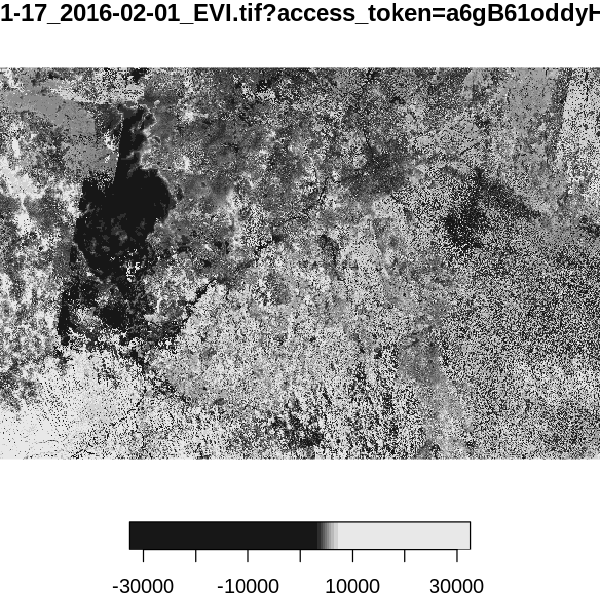

In [19]:
Sys.setenv(BDC_ACCESS_KEY = "a6gB61oddyHxMAZ08y098ynEq0s1hQ3siDZao245CV")

bdc_cbers4_cube <- sits_cube(
        source     = "BDC",
        name       = "amazonas",
        collection = "CB4_64_16D_STK-1",
        bands      = c("NDVI", "EVI"),
        tiles      = c("019023"),
        start_date = "2000-09-01",
        end_date   = "2018-08-31"
)

sits_timeline(bdc_cbers4_cube)

options(repr.plot.width = 5, repr.plot.height = 5)
plot(bdc_cbers4_cube, band = "EVI", time = 2)

In [17]:
points <- sits_get_data(bdc_cbers4_cube, file = "../data/samples/csv/samples_amazonia_sentinel2.csv")
head(points, 1)

All points have been retrieved



longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
-64.69448,-9.986312,2018-07-12,2018-08-29,Deforestation,amazonas,"17724.0000, 17740.0000, 17756.0000, 17772.0000, 0.8068, 0.7186, 0.7351, 0.3782, 0.5223, 0.4555, 0.5118, 0.6716, 0.0279, 0.0405, 0.0487, 0.1975, 0.0506, 0.0614, 0.0651, 0.1647, 0.0321, 0.0437, 0.0436, 0.1305, 0.3003, 0.2670, 0.2856, 0.2893"


# Study Case: SINOP Mato Grosso - MT, Brazil

In [9]:
file_name <- "../data/samples/csv/samples_sinop_crop.csv"
ext <- "csv"

In [10]:
input_data.tb <- read_file(file_name, ext)
# input_data.tb <- as_sample(input_data.tb)
head(input_data.tb, 5)

,id,longitude,latitude,start_date,end_date,label
,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,1,-55.65931,-11.76267,2013-09-14,2014-08-29,Pasture
2,2,-55.64833,-11.76385,2013-09-14,2014-08-29,Pasture
3,3,-55.66738,-11.78032,2013-09-14,2014-08-29,Forest
4,4,-55.64747,-11.75276,2013-09-14,2014-08-29,Pasture
5,5,-55.65742,-11.78788,2013-09-14,2014-08-29,Forest


In [11]:
group <- dplyr::group_by(input_data.tb, label)
agregation <- dplyr::summarise(group, n = n(), .groups = "drop_last")
mutation <- dplyr::mutate(agregation, percent = n/sum(n))
mutation <- data.frame(mutation)
mutation

label,n,percent
<chr>,<int>,<dbl>
Cerrado,3,0.1666667
Forest,3,0.1666667
Pasture,4,0.2222222
Soy_Corn,8,0.4444444


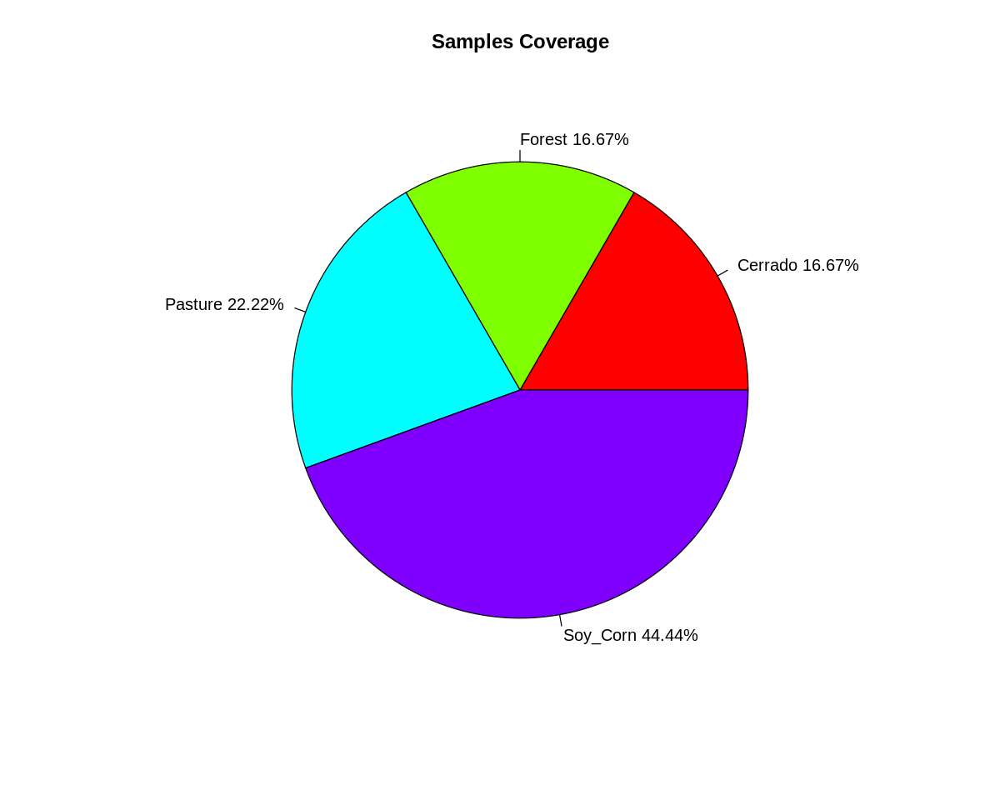

In [12]:
# Configure plot size 
options(repr.plot.width = 10, repr.plot.height = 8)
pie(
    mutation$percent,
    paste(mutation$label, " ", round(mutation$percent*100, 2), "%", sep=""),
    col=rainbow(length(mutation$label)), 
    main="Samples Coverage"
)

In [14]:
shape <- point_to_shape_sp(
    data.tb = input_data.tb,
    class_label = "Soy_Corn"
)
leaflet(shape, options = leafletOptions(minZoom = 0, maxZoom = 100)) %>%
        addTiles() %>%
            addMarkers(
                ~longitude, ~latitude,
                popup = ~as.character(
                    paste("Class '", label, "' |",
                        format(
                            as.Date(start_date),
                            format = "Start %Y-%m-%d"
                        ),
                        format(
                            as.Date(end_date),
                            format = "End %Y-%m-%d"
                        )
                    )))

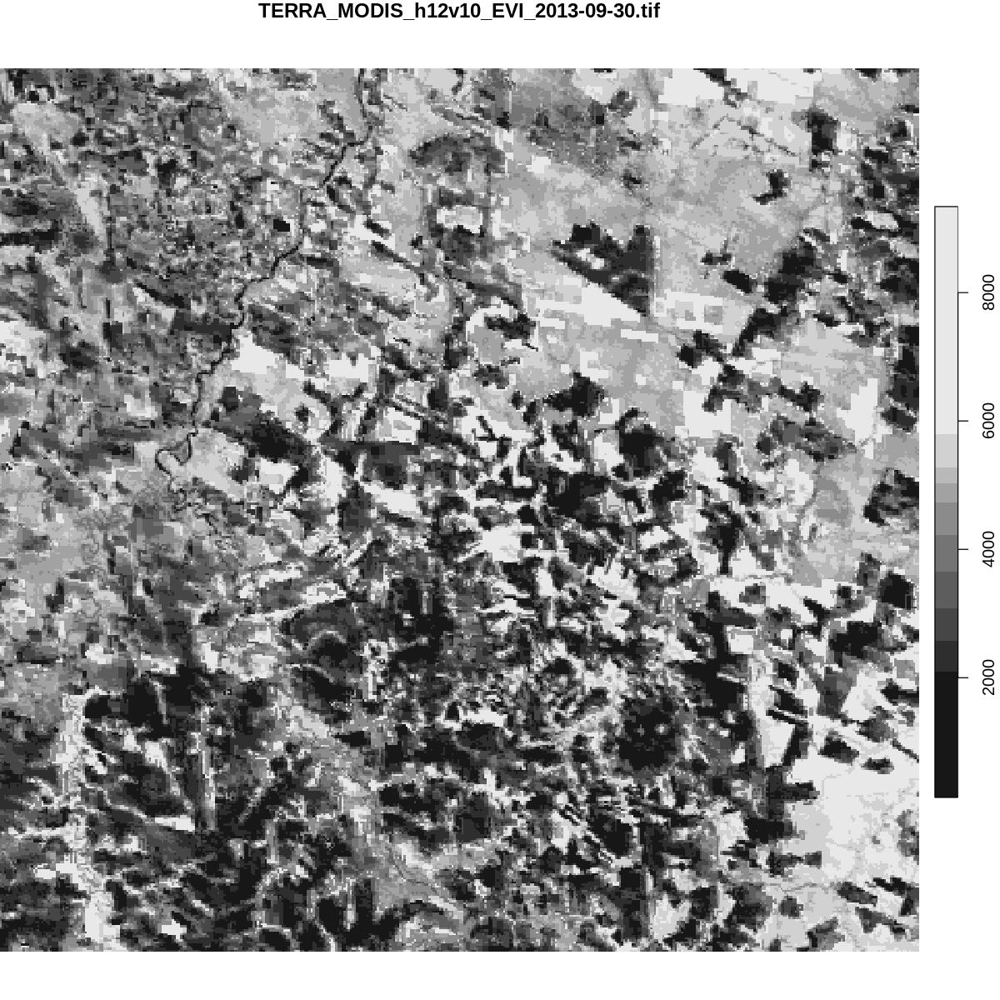

In [15]:
data_dir <- system.file("extdata/sinop", package = "sitsdata")
raster_cube <- sits_cube(
        source = "LOCAL",
        name = "sinop-2014",
        satellite = "TERRA",
        sensor = "MODIS",
        data_dir = data_dir
)
options(repr.plot.width = 10, repr.plot.height = 10)
plot(raster_cube, band = "EVI", time = 2)

In [16]:
points <- sits_get_data(raster_cube, file = file_name)
head(points, 1)

All points have been retrieved



longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
-55.65931,-11.76267,2013-09-14,2014-08-29,Pasture,sinop-2014,"15962.0000, 15978.0000, 15994.0000, 16010.0000, 16026.0000, 16042.0000, 16058.0000, 16071.0000, 16087.0000, 16103.0000, 16119.0000, 16135.0000, 16151.0000, 16167.0000, 16183.0000, 16199.0000, 16215.0000, 16231.0000, 16247.0000, 16263.0000, 16279.0000, 16295.0000, 16311.0000, 0.2106, 0.3169, 0.2674, 0.3430, 0.3897, 0.4803, 0.5254, 0.5254, 0.4680, 0.4708, 0.1790, 0.3151, 0.4756, 0.4006, 0.4509, 0.4284, 0.3551, 0.3730, 0.3146, 0.2480, 0.1967, 0.1883, 0.2211, 0.3386, 0.4327, 0.4608, 0.5664, 0.4799, 0.5867, 0.6543, 0.6543, 0.6912, 0.6439, 0.1721, 0.7537, 0.7299, 0.6144, 0.6653, 0.6510, 0.5940, 0.6135, 0.5229, 0.4271, 0.3451, 0.3182, 0.3272"


In [17]:
head(tibble(points$time_series[[1]]), 3)

Index,EVI,NDVI
<date>,<dbl>,<dbl>
2013-09-14,0.2106,0.3386
2013-09-30,0.3169,0.4327
2013-10-16,0.2674,0.4608


In [32]:
points[1,]

longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
-55.65931,-11.76267,2013-09-14,2014-08-29,Pasture,sinop-2014,"15962.0000, 15978.0000, 15994.0000, 16010.0000, 16026.0000, 16042.0000, 16058.0000, 16071.0000, 16087.0000, 16103.0000, 16119.0000, 16135.0000, 16151.0000, 16167.0000, 16183.0000, 16199.0000, 16215.0000, 16231.0000, 16247.0000, 16263.0000, 16279.0000, 16295.0000, 16311.0000, 0.2106, 0.3169, 0.2674, 0.3430, 0.3897, 0.4803, 0.5254, 0.5254, 0.4680, 0.4708, 0.1790, 0.3151, 0.4756, 0.4006, 0.4509, 0.4284, 0.3551, 0.3730, 0.3146, 0.2480, 0.1967, 0.1883, 0.2211, 0.3386, 0.4327, 0.4608, 0.5664, 0.4799, 0.5867, 0.6543, 0.6543, 0.6912, 0.6439, 0.1721, 0.7537, 0.7299, 0.6144, 0.6653, 0.6510, 0.5940, 0.6135, 0.5229, 0.4271, 0.3451, 0.3182, 0.3272"


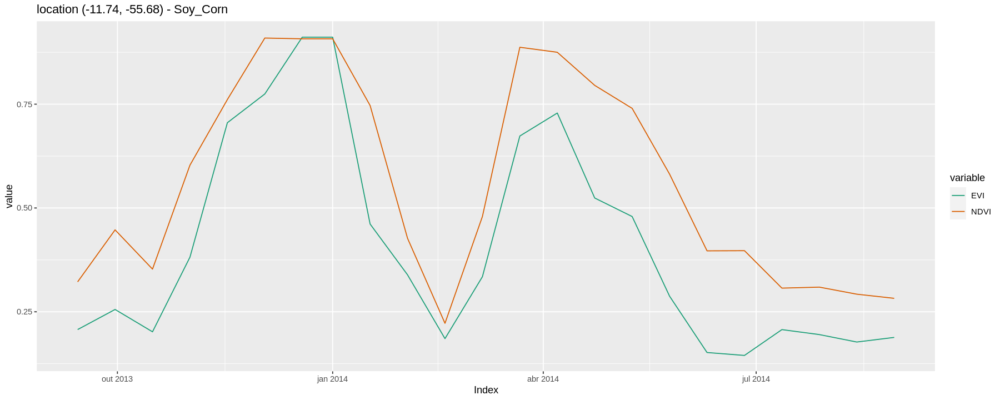

In [19]:
options(repr.plot.width = 15, repr.plot.height = 6)
filtered <- dplyr::filter(points, label == "Soy_Corn")
plot(filtered[1,])

In [20]:
save_file(points, "samples_sinop_response_sits", "rda")

In [21]:
wtss_inpe <- "https://brazildatacube.dpi.inpe.br/wtss/"
Rwtss::list_coverages(wtss_inpe)

[1] "MOD13Q1-6"               "MYD13Q1-6"              
 [3] "S2_10_16D_STK-1"         "S2-SEN2COR_10_16D_STK-1"
 [5] "S2_10-1"                 "CB4MUX_20-1"            
 [7] "CB4MUX_20_1M_STK-1"      "LC8_30-1"               
 [9] "LC8_30_16D_STK-1"        "CB4_20_1M_STK-1"        
[11] "LC8_30_6M_MEDSTK-1"      "CB4_64_16D_STK-1"       
[13] "CB4_64-1"                "LANDSAT-MOZ_30_1M_STK-1"

In [22]:
coverage <- "MOD13Q1-6"
desc <- Rwtss::describe_coverage(wtss_inpe, name = coverage)
desc$bands

---------------------------------------------------------------------
WTSS server URL = https://brazildatacube.dpi.inpe.br/wtss
Cube (coverage) = MOD13Q1-6

|satellite|sensor|bands                                                                                                                                                                                                                                                                                                                             |
|:--------|:-----|:---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
|TERRA    |MODIS |view_zenith_angle        , sun_zenith_angle         , pixel_reliability        , relative_azimuth_angle   , blue_reflectance         , red_re

[[1]]
 [1] "view_zenith_angle"         "sun_zenith_angle"         
 [3] "pixel_reliability"         "relative_azimuth_angle"   
 [5] "blue_reflectance"          "red_reflectance"          
 [7] "NIR_reflectance"           "MIR_reflectance"          
 [9] "NDVI"                      "EVI"                      
[11] "VI_Quality"                "composite_day_of_the_year"

In [23]:
sample <- data.frame(head(input_data.tb, 1))
start <- sample$start_date
end <- sample$end_date
lat <- sample$latitude
long <- sample$longitude
bands <- c('NDVI', 'EVI', 'NIR_reflectance')

In [24]:
response = Rwtss::time_series(
    wtss_inpe, 
    name = coverage, 
    attributes = bands, 
    longitude = long,
    latitude  = lat,
    start_date = start,
    end_date = end,
    token = "a6gB61oddyHxMAZ08y098ynEq0s1hQ3siDZao245CV"
)
cube <- response$cube
ts <- data.frame(response$time_series)
head(ts, 3)

,Index,EVI,NIR_reflectance,NDVI
,<date>,<dbl>,<dbl>,<dbl>
1,2013-09-14,0.2201,0.3063,0.3532
2,2013-09-30,0.2693,0.3370,0.4216
3,2013-10-16,0.2732,0.2680,0.4831


In [25]:
sample

,id,longitude,latitude,start_date,end_date,label
,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,1,-55.65931,-11.76267,2013-09-14,2014-08-29,Pasture


In [26]:
response <- dplyr::select(response, -label)
response <- dplyr::mutate(response, label = sample$label, .after = 4)
response

longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
-55.65931,-11.76267,2013-09-14,2014-08-29,Pasture,MOD13Q1-6,"15962.0000, 15978.0000, 15994.0000, 16010.0000, 16026.0000, 16042.0000, 16058.0000, 16071.0000, 16087.0000, 16103.0000, 16119.0000, 16135.0000, 16151.0000, 16167.0000, 16183.0000, 16199.0000, 16215.0000, 16231.0000, 16247.0000, 16263.0000, 16279.0000, 16295.0000, 16311.0000, 0.2201, 0.2693, 0.2732, 0.3043, 0.3717, 0.4933, 0.5487, 0.5487, 0.4909, 0.4983, 0.1777, 0.3125, 0.4216, 0.4547, 0.4689, 0.4521, 0.3707, 0.3862, 0.3270, 0.2519, 0.2131, 0.1838, 0.2002, 0.3063, 0.3370, 0.2680, 0.2620, 0.4712, 0.3798, 0.4727, 0.4727, 0.3681, 0.3534, 0.4338, 0.5070, 0.4552, 0.3529, 0.3664, 0.3485, 0.3039, 0.3108, 0.2981, 0.3048, 0.2707, 0.2918, 0.2903, 0.3532, 0.4216, 0.4831, 0.5480, 0.4112, 0.6175, 0.6641, 0.6641, 0.6982, 0.6705, 0.1667, 0.2757, 0.4343, 0.6587, 0.6738, 0.6622, 0.5940, 0.6099, 0.5259, 0.4098, 0.3575, 0.3153, 0.3261"


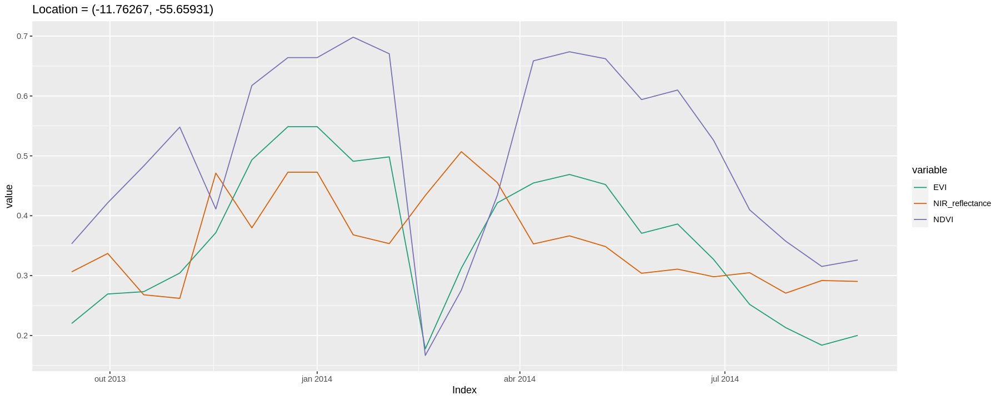

In [27]:
# Configure plot size 
options(repr.plot.width = 15, repr.plot.height = 6)
plot(response)

In [41]:
set.seed(777)
clustering.lst <- sits::sits_som_map(
  points,
  grid_xdim = 4,
  grid_ydim = 4,
  alpha = c(0.5, 0.01),
  distance = "euclidean",
  rlen = 100,
  som_radius = 1
)

clustering.lst

$data
# A tibble: 18 × 9
   longitude latitude start_date end_date   label    cube  time_series id_sample
       <dbl>    <dbl> <date>     <date>     <chr>    <chr> <list>          <int>
 1     -55.7    -11.8 2013-09-14 2014-08-29 Pasture  sino… <tibble [2…         1
 2     -55.6    -11.8 2013-09-14 2014-08-29 Pasture  sino… <tibble [2…         2
 3     -55.7    -11.8 2013-09-14 2014-08-29 Forest   sino… <tibble [2…         3
 4     -55.6    -11.8 2013-09-14 2014-08-29 Pasture  sino… <tibble [2…         4
 5     -55.7    -11.8 2013-09-14 2014-08-29 Forest   sino… <tibble [2…         5
 6     -55.6    -11.7 2013-09-14 2014-08-29 Forest   sino… <tibble [2…         6
 7     -55.7    -11.7 2013-09-14 2014-08-29 Soy_Corn sino… <tibble [2…         7
 8     -55.7    -11.7 2013-09-14 2014-08-29 Soy_Corn sino… <tibble [2…         8
 9     -55.7    -11.7 2013-09-14 2014-08-29 Soy_Corn sino… <tibble [2…         9
10     -55.6    -11.8 2013-09-14 2014-08-29 Soy_Corn sino… <tibble [2…        10
11 

In [100]:
as.list(sits_labels(points))

[[1]]
[1] "Cerrado"

[[2]]
[1] "Forest"

[[3]]
[1] "Pasture"

[[4]]
[1] "Soy_Corn"

In [106]:
clustering.lst$labelled_neurons

id_neuron,label_samples,count,prior_prob,post_prob
<dbl>,<chr>,<dbl>,<dbl>,<dbl>
1,Soy_Corn,3,1.0000000,0.9999999
2,Soy_Corn,1,1.0000000,0.9999999
3,NoSamples,0,0.0000000,0.0000000
4,Pasture,1,0.5000000,0.4000000
4,Soy_Corn,1,0.5000000,0.4000000
5,Soy_Corn,1,1.0000000,0.9999998
6,NoSamples,0,0.0000000,0.0000000
7,Soy_Corn,1,1.0000000,0.9999994
8,Pasture,2,1.0000000,0.9999997


In [139]:
collapsibleTree(clustering.lst$labelled_neurons, c("label_samples", "count", "id_neuron"))

HTML widgets cannot be represented in plain text (need html)

In [142]:
hc


Call:
stats::hclust(d = dist(t(codes)), method = "ward.D2")

Cluster method   : ward.D2 
Distance         : Euclidean 
Number of objects: 18 


Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


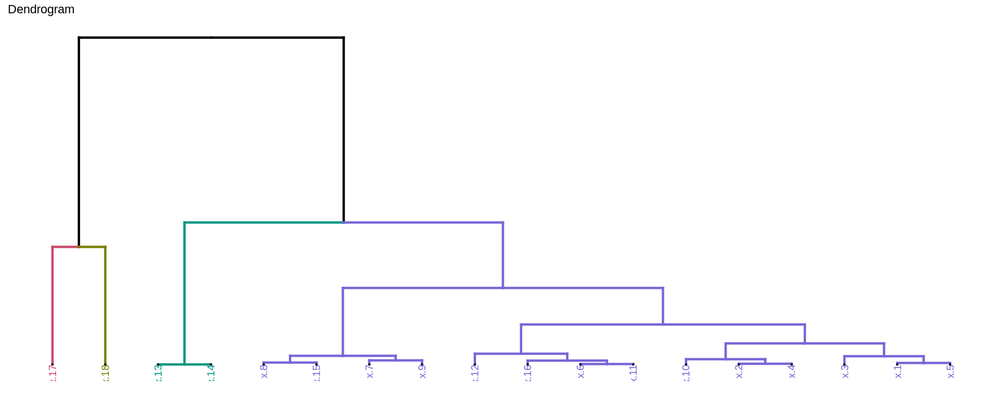

In [144]:
codes <- zoo::zoo(t(clustering.lst$data[[1]]))
## use hierarchical clustering to cluster the codebook vectors.
# Cut dendrogram in 4 groups
hc <- stats::hclust(dist(t(codes)), method = "ward.D2")
#Cuts a tree, e.g., as resulting from hclust, into several groups either 
#by specifying the desired number(s) of groups or the cut height(s).
som_cluster <- stats::cutree(hc, 1)
#plot dendrogram
dend <- hc%>% as.dendrogram %>%
  set("branches_k_color", k = 4) %>% set("branches_lwd", 1.2) %>%
  set("labels_cex", 0.8) %>% set("labels_colors", k = 4) %>%
  set("leaves_pch", 19) %>% set("leaves_cex", 0.5) 
ggd1 <- as.ggdend(dend)
ggplot(ggd1, horiz = FALSE) + ggtitle("Dendrogram")

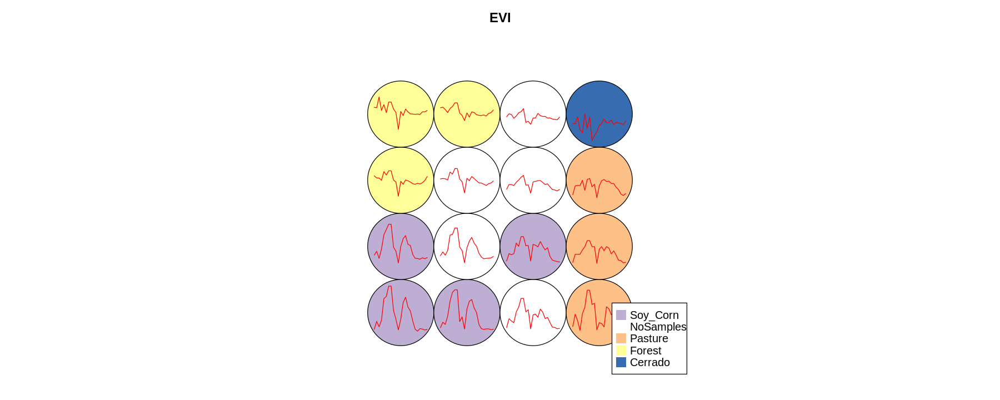

In [140]:
plot(clustering.lst, type = "codes", whatmap = 1)

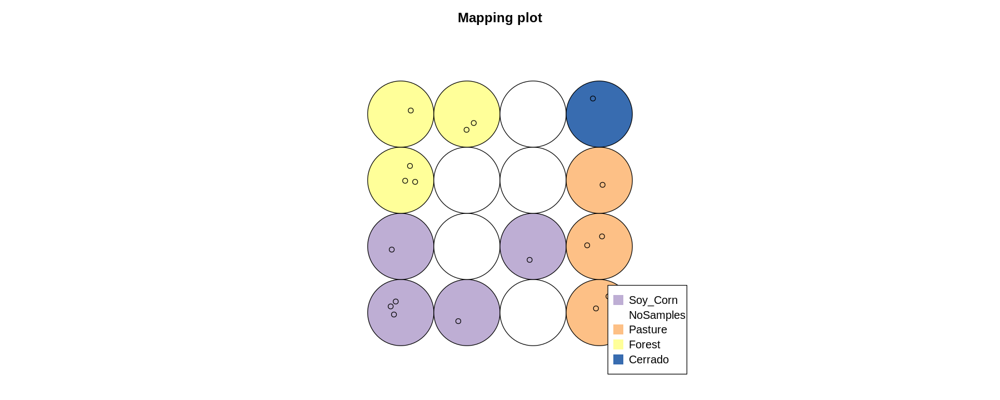

In [49]:
plot(clustering.lst, type = "mapping")

Joining, by = "id_neuron"



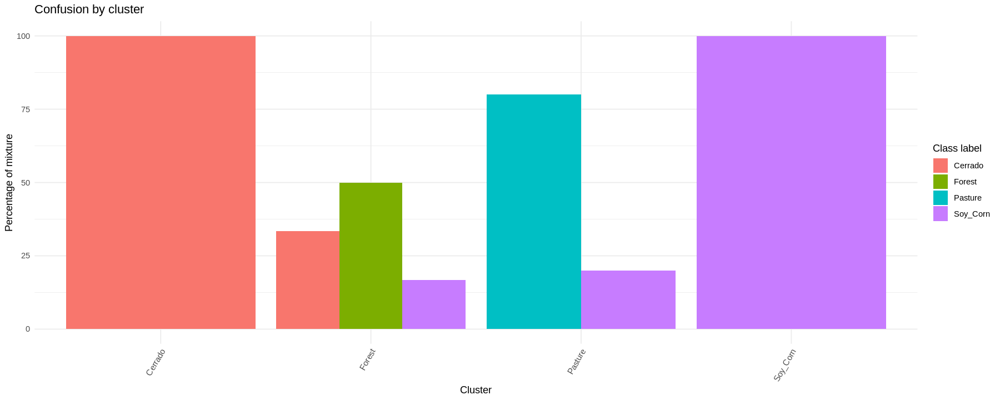

In [141]:
cluster_purity <- sits_som_evaluate_cluster(clustering.lst)
plot(cluster_purity)

# Study Case: SENTINEL AMAZONAS Rondônia - RO, Brazil

In [27]:
file_name <- "../data/samples/csv/samples_amazonia_sentinel2.csv"
input_data.tb <- read_file(file_name, "csv")
head(input_data.tb, 3)

,id,longitude,latitude,start_date,end_date,label
,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,1,-64.69448,-9.986312,2018-07-12,2019-07-28,Deforestation
2,2,-64.62979,-9.996668,2018-07-12,2019-07-28,Deforestation
3,3,-64.52163,-9.979772,2018-07-12,2019-07-28,Deforestation


In [28]:
group <- dplyr::group_by(input_data.tb, label)
agregation <- dplyr::summarise(group, n = n(), .groups = "drop_last")
mutation <- dplyr::mutate(agregation, percent = n/sum(n))
mutation <- data.frame(mutation)
mutation

label,n,percent
<chr>,<int>,<dbl>
Deforestation,157,0.1306156
Forest,414,0.3444260
NatNonForest,171,0.1422629
Pasture,460,0.3826955


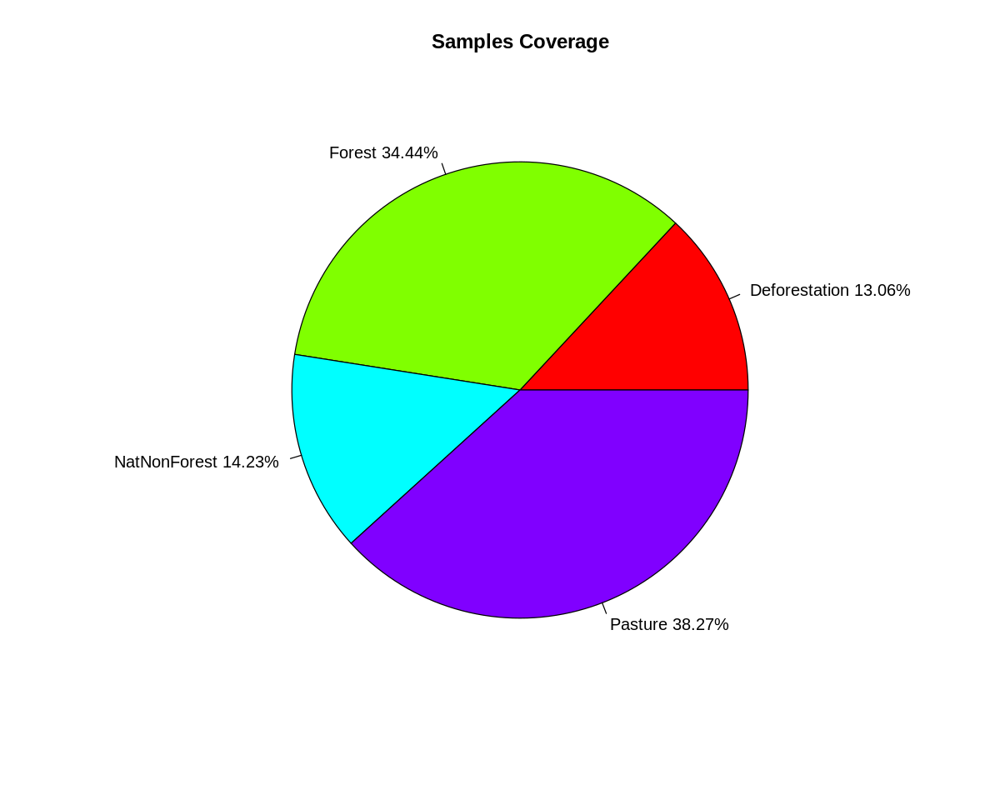

In [29]:
# Configure plot size 
options(repr.plot.width = 10, repr.plot.height = 8)
pie(
    mutation$percent,
    paste(mutation$label, " ", round(mutation$percent*100, 2), "%", sep=""),
    col=rainbow(length(mutation$label)), 
    main="Samples Coverage"
)

In [30]:
shape <- point_to_shape_sp(
    data.tb = input_data.tb,
    class_label = "Deforestation"
)
leaflet(shape, options = leafletOptions(minZoom = 0, maxZoom = 100)) %>%
        addTiles() %>%
            addMarkers(
                ~longitude, ~latitude,
                popup = ~as.character(
                    paste("Class '", label, "' |",
                        format(
                            as.Date(start_date),
                            format = "Start %Y-%m-%d"
                        ),
                        format(
                            as.Date(end_date),
                            format = "End %Y-%m-%d"
                        )
                    )))

HTML widgets cannot be represented in plain text (need html)

In [32]:
# Executar os comandos em testes_python.ipynb
# Renomear os arquivos de band4 e band8 para B04 e B08
# ou atualizar o arquivo config.yml em R/library/sits
data_dir <- "../data/raster/amazonas/Sentinel-2/077095"
sentinel_cube <- sits_cube(
    source     = "LOCAL",
    name       = "sentinel-077095",
    satellite  = "SENTINEL-2",
    sensor     = "MSI",
    resolution = "10m",
    data_dir   = data_dir,
    parse_info = c("X1", "X2", "X3", "X4", "X5", "tile", "date", "X6", "band")
)

downsample set to c(28)


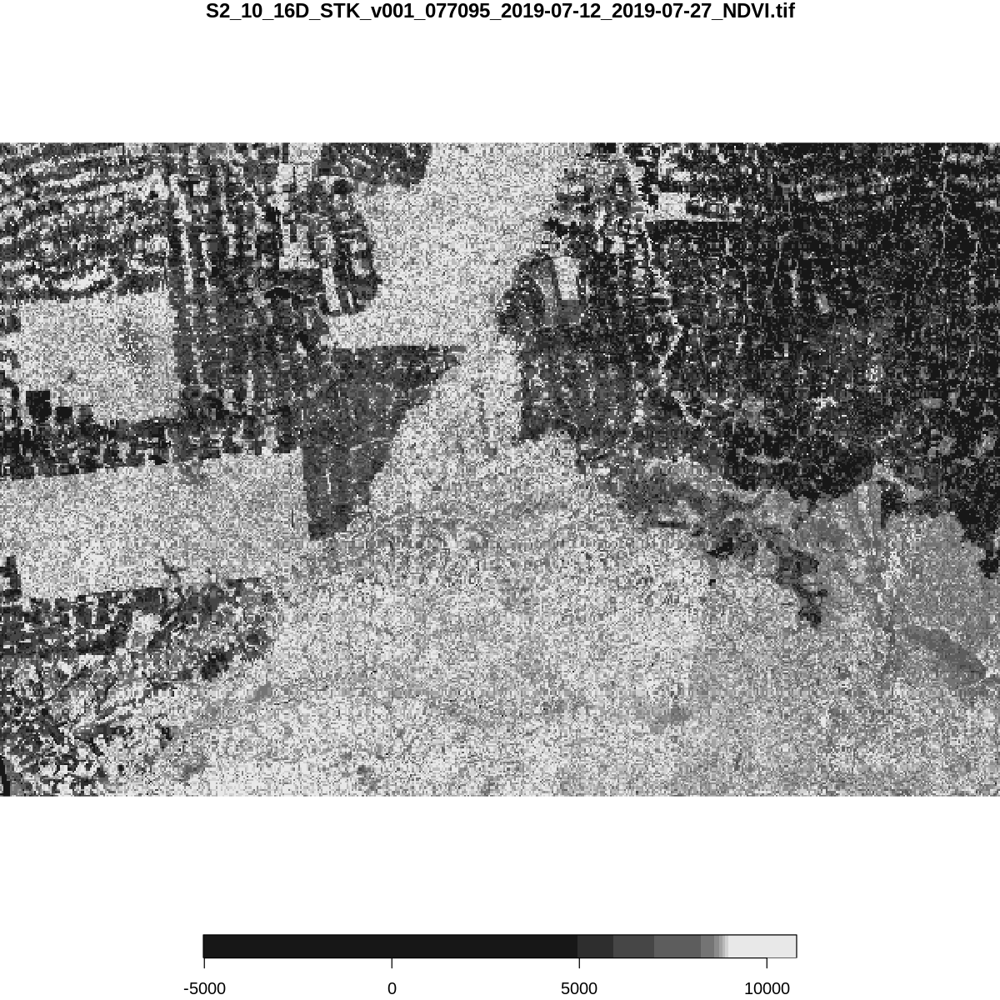

In [37]:
options(repr.plot.width = 10, repr.plot.height = 10)
plot(sentinel_cube, band = "NDVI", time = 40)

In [16]:
# %time%
points <- sits_get_data(sentinel_cube, file = file_name)
head(points, 1)

All points have been retrieved



longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
-64.69448,-9.986312,2018-07-12,2019-07-28,Deforestation,sentinel-077095,"17724.0000, 17740.0000, 17756.0000, 17772.0000, 17788.0000, 17804.0000, 17820.0000, 17836.0000, 17852.0000, 17868.0000, 17884.0000, 17897.0000, 17913.0000, 17929.0000, 17945.0000, 17961.0000, 17977.0000, 17993.0000, 18009.0000, 18025.0000, 18041.0000, 18057.0000, 18073.0000, 18089.0000, 18105.0000, 0.0248, 0.0248, 0.0246, 0.0755, 0.0800, 0.0655, 0.0758, 0.0959, 0.4346, 0.0650, 0.0682, 0.4307, 0.0871, 0.0771, 0.4840, 0.0563, 0.0727, 0.0742, 0.1910, 0.0472, 0.3008, 0.0353, 0.0316, 0.0339, 0.0443, 0.2646, 0.2466, 0.2512, 0.2375, 0.2341, 0.2266, 0.1345, 0.2670, 0.4693, 0.1865, 0.1330, 0.5391, 0.2121, 0.2723, 0.5525, 0.3076, 0.2699, 0.2342, 0.3495, 0.2927, 0.4704, 0.3264, 0.3604, 0.3491, 0.3039, 0.5138, 0.4855, 0.5200, 0.3399, 0.3506, 0.4005, 0.1706, 0.4271, 0.3059, 0.3524, 0.1932, 0.5605, 0.2947, 0.4333, 0.3687, 0.5271, 0.4340, 0.3570, 0.4418, 0.5068, 0.4598, 0.6014, 0.6695, 0.6498, 0.5481, 0.8414, 0.8326, 0.8419, 0.5491, 0.5449, 0.6199, 0.3437, 0.5773, 0.1046, 0.5973, 0.4118, 0.0933, 0.4751, 0.6047, 0.1392, 0.7165, 0.6259, 0.5580, 0.3495, 0.7512, 0.2574, 0.8181, 0.8509, 0.8406, 0.7710"


In [17]:
head(tibble(points$time_series[[1]]), 3)

Index,B04,B08,EVI,NDVI
<date>,<dbl>,<dbl>,<dbl>,<dbl>
2018-07-12,0.0248,0.2646,0.5138,0.8414
2018-07-28,0.0248,0.2466,0.4855,0.8326
2018-08-13,0.0246,0.2512,0.5200,0.8419


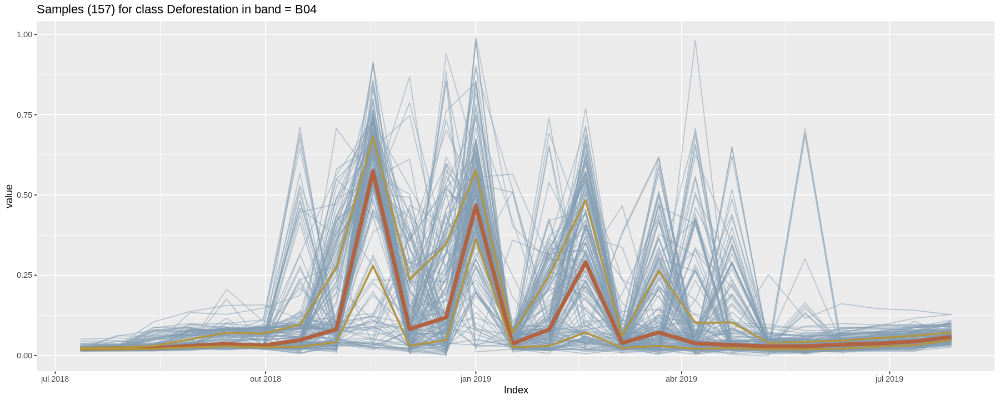

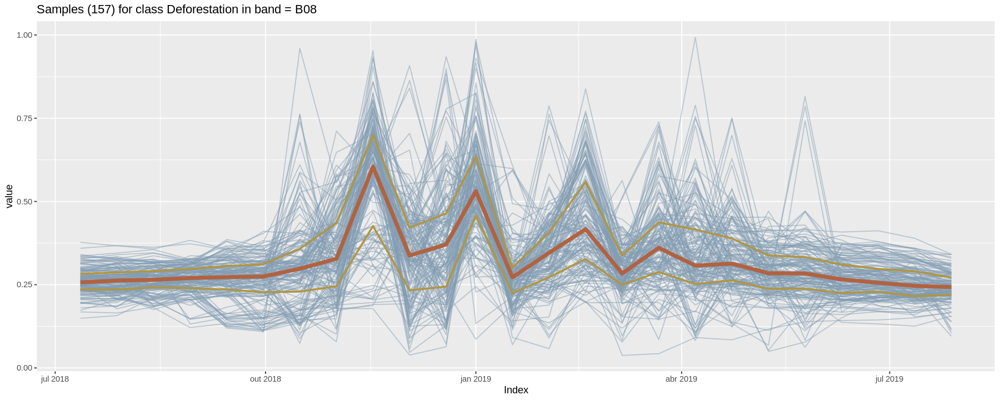

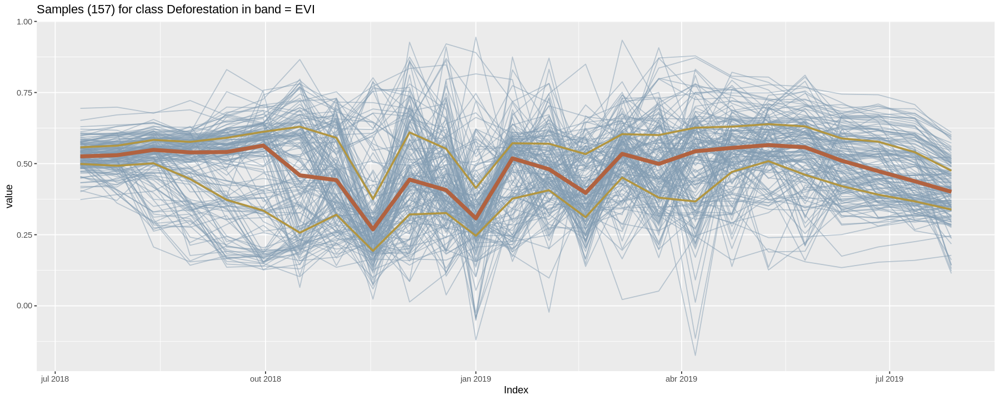

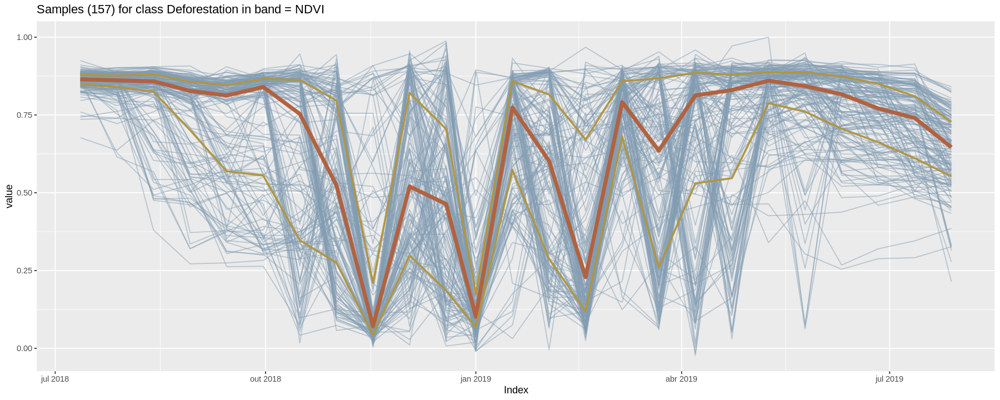

In [18]:
options(repr.plot.width = 15, repr.plot.height = 6)
filtered <- dplyr::filter(points, label == "Deforestation")
plot(filtered)

In [19]:
save_file(points, "samples_amazonia_sentinel-2")

# Study Case: CBERS-4 AMAZONAS Rondônia - RO, Brazil

In [38]:
file_name <- "../data/samples/csv/samples_amazonia_sentinel2.csv"
input_data.tb <- read_file(file_name, "csv")
head(input_data.tb, 3)

,id,longitude,latitude,start_date,end_date,label
,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,1,-64.69448,-9.986312,2018-07-12,2019-07-28,Deforestation
2,2,-64.62979,-9.996668,2018-07-12,2019-07-28,Deforestation
3,3,-64.52163,-9.979772,2018-07-12,2019-07-28,Deforestation


In [39]:
# Executar os comandos em testes_python.ipynb
# Renomear os arquivos de band4 e band8 para B04 e B08
# ou atualizar o arquivo config.yml em R/library/sits
data_dir <- "../data/raster/amazonas/CBERS-4/019023"
cbers_cube <- sits_cube(
    source     = "LOCAL",
    name       = "CBERS-4-077095",
    satellite  = "CBERS-4",
    sensor     = "AWFI",
    resolution = "64m",
    data_dir   = data_dir,
    parse_info = c("X1", "X2", "X3", "X4", "X5", "tile", "date", "X6", "band")
)

In [40]:
sits_bands(cbers_cube)

[1] "B13"   "B14"   "B15"   "CLOUD" "NDVI"

downsample set to c(17)


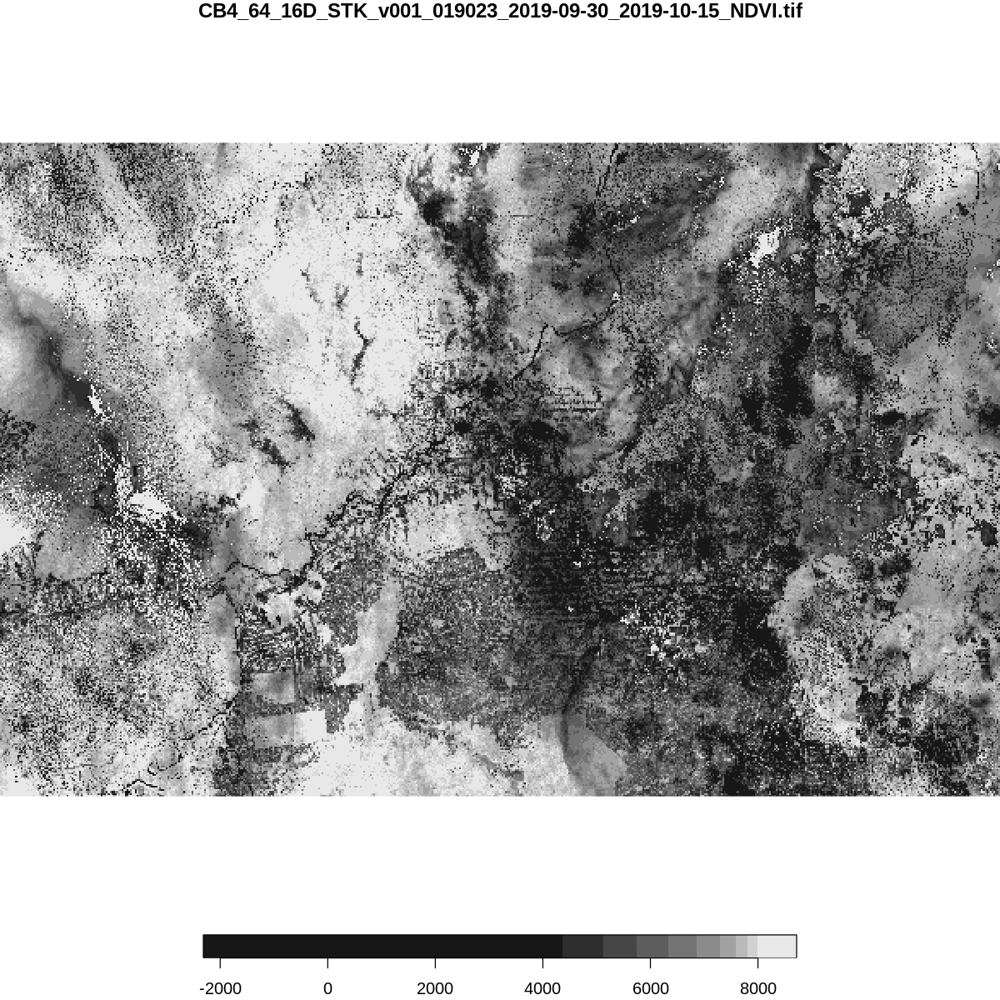

In [44]:
options(repr.plot.width = 10, repr.plot.height = 10)
plot(cbers_cube, band = "NDVI", time = 20)

In [54]:
# %time%
points <- sits_get_data(cbers_cube, file = file_name)
head(points, 1)

All points have been retrieved



longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
-64.69448,-9.986312,2018-12-03,2019-07-28,Deforestation,CBERS-4-077095,"17868.0000, 17884.0000, 17897.0000, 17913.0000, 17929.0000, 17945.0000, 17961.0000, 17977.0000, 17993.0000, 18009.0000, 18025.0000, 18041.0000, 18057.0000, 18073.0000, 18089.0000, 18105.0000, 0.3908, 0.3364, 0.0826, 0.0917, 0.0370, 0.3933, 0.0947, 0.0843, 0.0545, 0.0792, 0.0465, 0.0370, 0.0334, 0.0405, 0.0381, 0.0499, 0.4077, 0.3315, 0.1087, 0.1241, 0.0726, 0.4636, 0.1307, 0.1107, 0.0721, 0.1008, 0.0738, 0.0653, 0.0640, 0.0677, 0.0698, 0.0745, 0.3578, 0.3648, 0.1075, 0.1112, 0.0571, 0.4226, 0.1057, 0.0912, 0.0525, 0.0808, 0.0527, 0.0451, 0.0441, 0.0429, 0.0457, 0.0495, 0.2138, 0.1374, 0.4554, 0.5020, 0.6607, 0.2054, 0.5628, 0.5478, 0.6394, 0.6056, 0.7606, 0.7765, 0.7839, 0.8006, 0.7823, 0.7695"


In [55]:
head(tibble(points$time_series[[1]]), 3)

Index,B13,B14,B15,NDVI
<date>,<dbl>,<dbl>,<dbl>,<dbl>
2018-12-03,0.3908,0.4077,0.3578,0.2138
2018-12-19,0.3364,0.3315,0.3648,0.1374
2019-01-01,0.0826,0.1087,0.1075,0.4554


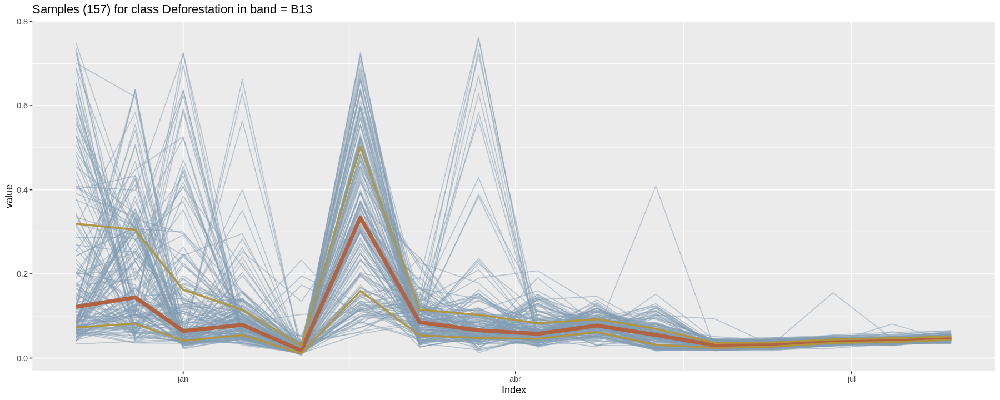

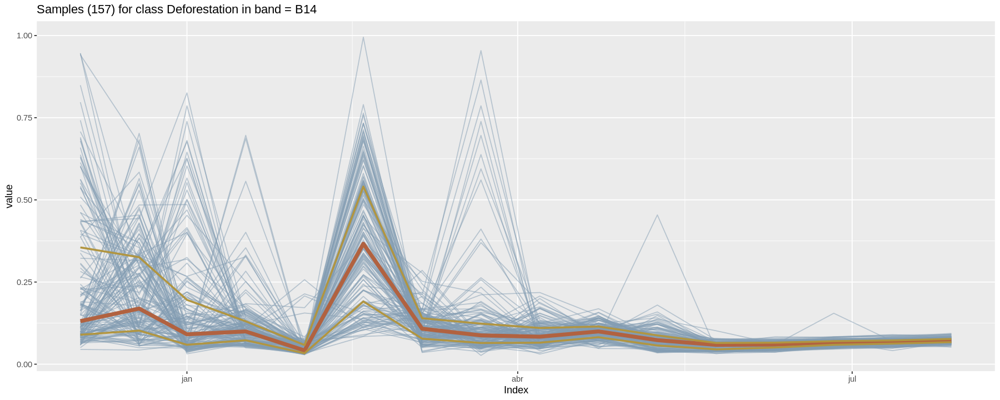

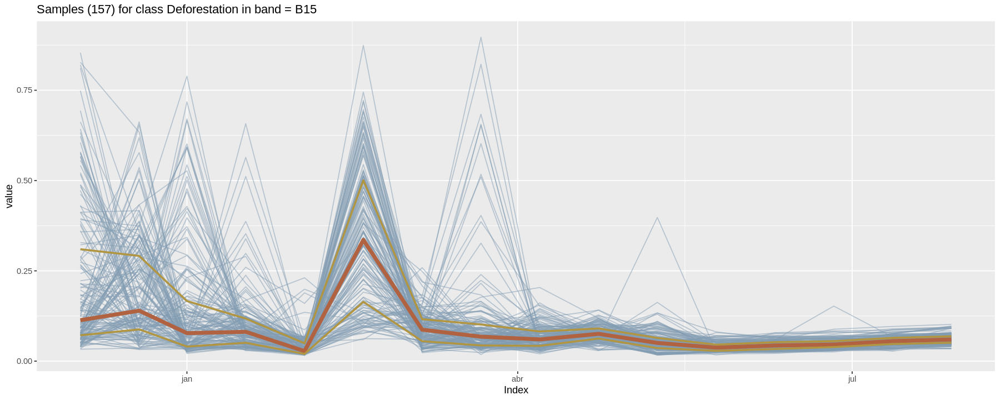

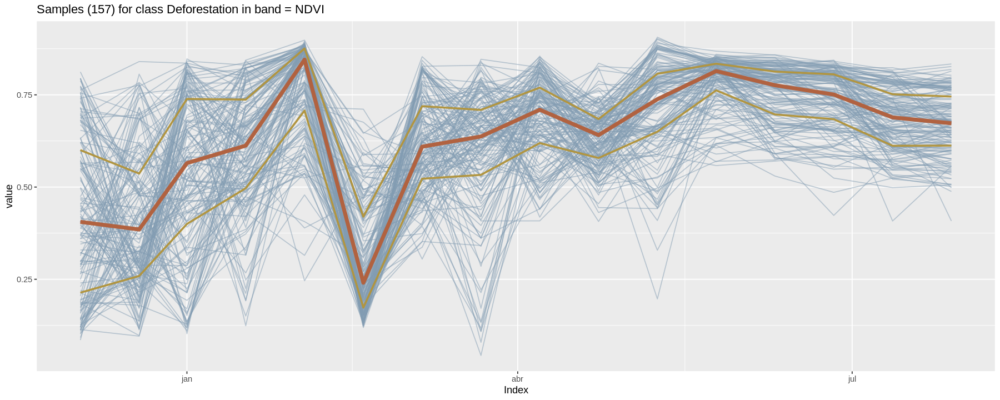

In [56]:
options(repr.plot.width = 15, repr.plot.height = 6)
filtered <- dplyr::filter(points, label == "Deforestation")
plot(filtered)

In [57]:
save_file(points, "samples_amazonia_cbers-4")

## Study Case: CBERS-4 AMAZONAS Rondônia - RO, Brazil - Samples Assessment

In [29]:
file_name <- "../data/ts_coupled_samples/samples_amazonia_cbers-4.rda"
input_data.tb <- read_file(file_name, "rda")
head(input_data.tb, 1)

longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
-64.69448,-9.986312,2018-12-03,2019-07-28,Deforestation,CBERS-4-077095,"17868.0000, 17884.0000, 17897.0000, 17913.0000, 17929.0000, 17945.0000, 17961.0000, 17977.0000, 17993.0000, 18009.0000, 18025.0000, 18041.0000, 18057.0000, 18073.0000, 18089.0000, 18105.0000, 0.3908, 0.3364, 0.0826, 0.0917, 0.0370, 0.3933, 0.0947, 0.0843, 0.0545, 0.0792, 0.0465, 0.0370, 0.0334, 0.0405, 0.0381, 0.0499, 0.4077, 0.3315, 0.1087, 0.1241, 0.0726, 0.4636, 0.1307, 0.1107, 0.0721, 0.1008, 0.0738, 0.0653, 0.0640, 0.0677, 0.0698, 0.0745, 0.3578, 0.3648, 0.1075, 0.1112, 0.0571, 0.4226, 0.1057, 0.0912, 0.0525, 0.0808, 0.0527, 0.0451, 0.0441, 0.0429, 0.0457, 0.0495, 0.2138, 0.1374, 0.4554, 0.5020, 0.6607, 0.2054, 0.5628, 0.5478, 0.6394, 0.6056, 0.7606, 0.7765, 0.7839, 0.8006, 0.7823, 0.7695"


In [30]:
sits_labels_summary(input_data.tb)

label,count,prop
<chr>,<int>,<dbl>
Deforestation,157,0.1306156
Forest,414,0.3444260
NatNonForest,171,0.1422629
Pasture,460,0.3826955


In [31]:
sits_bands(input_data.tb)

[1] "B13"  "B14"  "B15"  "NDVI"

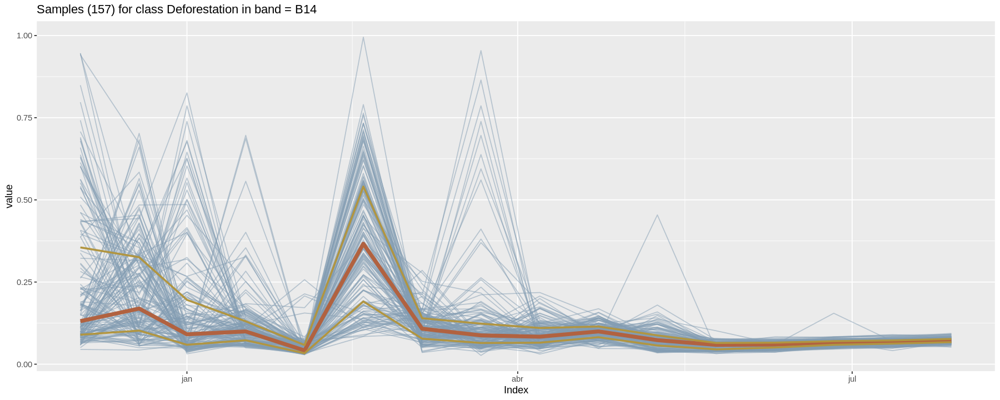

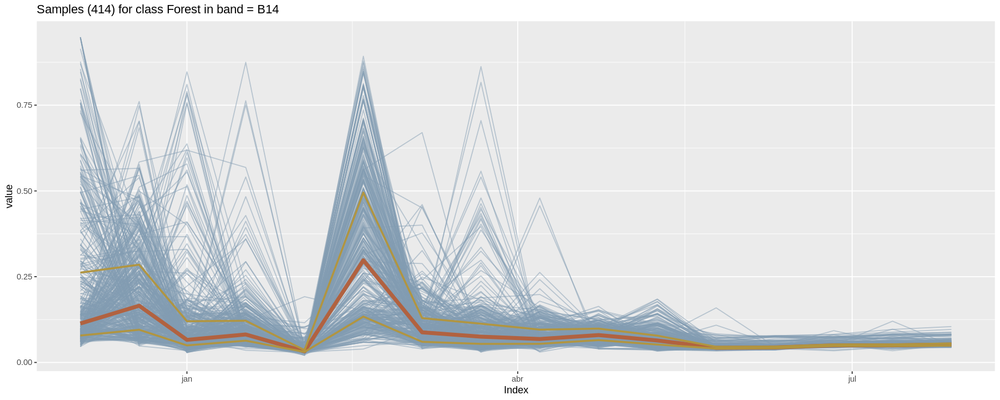

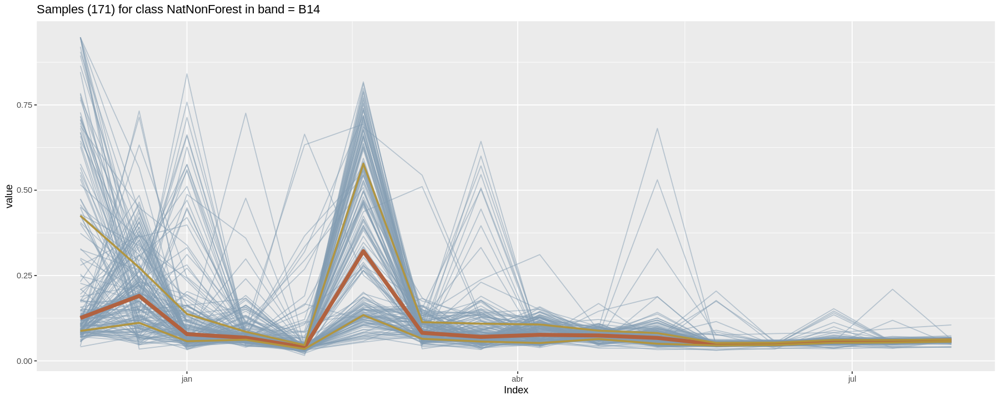

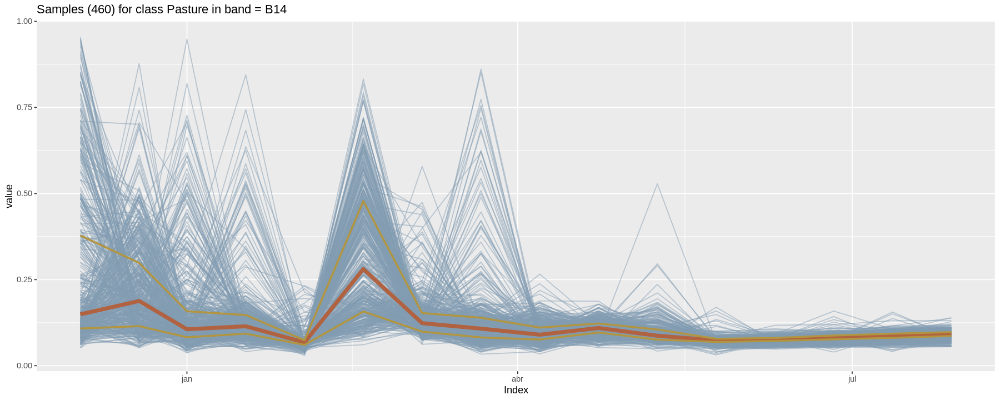

In [33]:
options(repr.plot.width = 15, repr.plot.height = 6)
plot(sits_select(input_data.tb, bands = "B14"))